Lung Cancer Analysis

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cptac
import binarization_functions as bf
import gseapy as gp
from gseapy.plot import barplot, heatmap, dotplot
import json
import requests
import random
import deva

In [2]:
luad = cptac.Luad()
proteomics = luad.get_proteomics()
clinical = luad.get_clinical()

## Step 2: Data Cleaning and Choosing Attributes to A/B Test
First, we will drop columns we are not interested in, and then make each of the columns binary

In [3]:
for col in clinical.columns:
    print(col)
    print(clinical[col].value_counts())
    print('\n')

Patient_ID
C3N.00738.N    1
C3L.01889      1
C3N.02002      1
C3N.00704      1
C3L.00263      1
              ..
C3L.00095      1
C3L.00279      1
C3N.00175      1
C3N.00547      1
C3N.01488      1
Name: Patient_ID, Length: 215, dtype: int64


Sample_Tumor_Normal
Tumor     113
Normal    102
Name: Sample_Tumor_Normal, dtype: int64


Aliquot
CPT0148080004    2
CPT0146580004    2
CPT0067290003    1
CPT0118880003    1
CPT0105060003    1
                ..
CPT0000920017    1
CPT0008450003    1
CPT0082850004    1
CPT0146680004    1
CPT0109680004    1
Name: Aliquot, Length: 213, dtype: int64


Smoking.Status
smoker        112
non-smoker     88
Name: Smoking.Status, dtype: int64


Stage
1B    55
1A    30
3A    23
2B    17
2A    16
1      2
3      2
Name: Stage, dtype: int64


Region.of.Origin
asian      122
western     93
Name: Region.of.Origin, dtype: int64


Country.of.Origin
vietnam     85
usa         67
china       37
other       12
ukraine      5
bulgaria     4
poland       3
russia      

In [4]:
cols_to_drop = ['Patient_ID', 'Aliquot']

for col in clinical.columns:
    if len(clinical[col].value_counts()) < 2:
        cols_to_drop.append(col)

annotations = clinical.copy()
annotations = annotations.drop(cols_to_drop, axis=1)

In [5]:
#Converting columns that should be numeric to their correct data type
annotations['Age'] = pd.to_numeric(annotations['Age'])
annotations['Height.cm'] = pd.to_numeric(annotations['Height.cm'])
annotations['Weight.kg'] = pd.to_numeric(annotations['Weight.kg'])
annotations['BMI'] = pd.to_numeric(annotations['BMI'])
annotations['BMI'] = bf.binarizeRange(annotations, 'BMI', 18.5, 25, 'Healthy', 'Unhealthy')
annotations['Cigarettes.per.Day'] = pd.to_numeric(annotations['Cigarettes.per.Day'])
annotations['Pack.Years.Smoked'] = pd.to_numeric(annotations['Pack.Years.Smoked'])

In [6]:
# Minor Data Cleaning
for col in annotations.columns:
    if np.issubdtype(annotations[col].dtype, np.number):
        mean = annotations[col].mean()
        annotations[col]= bf.binarizeCutOff(annotations, col, mean,
                                            "Above_Mean("+str(round(mean, 2))+")",
                                            "Below_Mean("+str(round(mean, 2))+")")

In [7]:
annotations = deva.binarize_annotations(annotations)

## Step 3: Perform Outlier Analysis
Using the Blacksheep-outliers package, deva, we will create two tables: one of all the significant up-regulated genes per patient (which we will call outliers), and one of the q-values for significantly enriched genes based on our binarized clinical attributes (which we will call qvalues).

In [8]:
outliers, qvalues = deva.run_outliers(proteomics.transpose(), 
                                      annotations,
                                      up_or_down='up',
                                      aggregate=False)

09/10/2019 18:03:34:WARNING:These samples were not found in outliers table: S095, S107, continuing without them. 
09/10/2019 18:03:35:WARNING:No rows tested for fisherFDR_Sample_Tumor_Normal_Tumor
09/10/2019 18:03:35:WARNING:These samples were not found in outliers table: S095, S107, continuing without them. 
09/10/2019 18:03:35:WARNING:No rows tested for fisherFDR_Smoking.Status_smoker
09/10/2019 18:03:36:WARNING:No rows tested for fisherFDR_Smoking.Status_non-smoker
09/10/2019 18:03:36:WARNING:No rows tested for fisherFDR_Stage_1B_not-1B
09/10/2019 18:03:36:WARNING:No rows tested for fisherFDR_Stage_1B_1B
09/10/2019 18:03:36:WARNING:No rows tested for fisherFDR_Stage_1A_not-1A
09/10/2019 18:03:36:WARNING:No rows tested for fisherFDR_Stage_1A_1A
09/10/2019 18:03:36:WARNING:No rows tested for fisherFDR_Stage_3A_not-3A
09/10/2019 18:03:37:WARNING:No rows tested for fisherFDR_Stage_2B_not-2B
09/10/2019 18:03:37:WARNING:No rows tested for fisherFDR_Stage_2B_2B
09/10/2019 18:03:37:WARNING:

09/10/2019 18:04:09:WARNING:No rows tested for fisherFDR_Smoking.History_Smoking history not available_not-Smoking history not available
09/10/2019 18:04:10:WARNING:These samples were not found in outliers table: S095, S107, continuing without them. 
09/10/2019 18:04:10:WARNING:No rows tested for fisherFDR_Smoking.History_Current reformed smoker, years unknown_not-Current reformed smoker, years unknown
09/10/2019 18:04:14:WARNING:These samples were not found in outliers table: S095, S107, continuing without them. 
09/10/2019 18:04:15:WARNING:No rows tested for fisherFDR_Secondhand.Smoke_Exposure to secondhand smoke history not available_Exposure to secondhand smoke history not available
09/10/2019 18:04:15:WARNING:No rows tested for fisherFDR_Secondhand.Smoke_Exposure to secondhand smoke history not available_not-Exposure to secondhand smoke history not available
09/10/2019 18:04:15:WARNING:These samples were not found in outliers table: S095, S107, continuing without them. 
09/10/2019

In [9]:
outliers_down, qvalues_down = deva.run_outliers(proteomics.transpose(), 
                                                annotations, 
                                                up_or_down='down', 
                                                aggregate=False)

09/10/2019 18:04:39:WARNING:These samples were not found in outliers table: S095, S107, continuing without them. 
09/10/2019 18:04:39:WARNING:No rows tested for fisherFDR_Sample_Tumor_Normal_Tumor
09/10/2019 18:04:40:WARNING:No rows tested for fisherFDR_Sample_Tumor_Normal_Normal
09/10/2019 18:04:40:WARNING:These samples were not found in outliers table: S095, S107, continuing without them. 
09/10/2019 18:04:40:WARNING:No rows tested for fisherFDR_Smoking.Status_smoker
09/10/2019 18:04:40:WARNING:No rows tested for fisherFDR_Smoking.Status_non-smoker
09/10/2019 18:04:40:WARNING:No rows tested for fisherFDR_Stage_1B_not-1B
09/10/2019 18:04:41:WARNING:No rows tested for fisherFDR_Stage_1B_1B
09/10/2019 18:04:41:WARNING:No rows tested for fisherFDR_Stage_1A_not-1A
09/10/2019 18:04:41:WARNING:No rows tested for fisherFDR_Stage_1A_1A
09/10/2019 18:04:42:WARNING:No rows tested for fisherFDR_Stage_3A_not-3A
09/10/2019 18:04:42:WARNING:No rows tested for fisherFDR_Stage_2B_not-2B
09/10/2019 18

09/10/2019 18:05:09:WARNING:No rows tested for fisherFDR_Smoking.History_Current reformed smoker, more than 15 years_Current reformed smoker, more than 15 years
09/10/2019 18:05:09:WARNING:These samples were not found in outliers table: S095, S107, continuing without them. 
09/10/2019 18:05:10:WARNING:No rows tested for fisherFDR_Smoking.History_Current reformed smoker within past 15 years_not-Current reformed smoker within past 15 years
09/10/2019 18:05:10:WARNING:These samples were not found in outliers table: S095, S107, continuing without them. 
09/10/2019 18:05:10:WARNING:No rows tested for fisherFDR_Smoking.History_Smoking history not available_not-Smoking history not available
09/10/2019 18:05:10:WARNING:These samples were not found in outliers table: S095, S107, continuing without them. 
09/10/2019 18:05:11:WARNING:No rows tested for fisherFDR_Smoking.History_Current reformed smoker, years unknown_not-Current reformed smoker, years unknown
09/10/2019 18:05:14:WARNING:These samp

In [10]:
length = int(len(outliers.df.columns) / 2)
temp_outliers = outliers.df.transpose()
only_outliers_up = temp_outliers[:length]
outliers_up_dict = {}
for i in range(length):
    key = proteomics.index[i]
    my_filter = only_outliers_up.iloc[i] == 1.0
    value = list(only_outliers_up.iloc[i][my_filter].index.get_level_values('Name'))
    outliers_up_dict[key] = value

In [11]:
length = int(len(outliers_down.df.columns) / 2)
temp_outliers_down = outliers_down.df.transpose()
only_outliers_down = temp_outliers_down[:length]
outliers_down_dict = {}
for i in range(length):
    key = proteomics.index[i]
    my_filter = only_outliers_down.iloc[i] == 1.0
    value = list(only_outliers_down.iloc[i][my_filter].index.get_level_values('Name'))
    outliers_down_dict[key] = value

## Step 4: Visualize these enrichments

First, we will determine which clinical attributes have significant enrichments, and save them to a list for both up-regulated outliers, and down-regulated outliers.

In [12]:
#Drop Columns with less than 4 significant up-regulated enrichments
sig_cols_up = []
for col in qvalues.df.columns:
    sig_col = bf.significantEnrichments(qvalues.df, col)
    if sig_col is not None and len(sig_col) >= 4:
        sig_cols_up.append(sig_col)
    else:
        results_up = qvalues.df.drop(col, axis=1)

In [13]:
#Drop Columns with less than 4 significant down-regulated enrichments
sig_cols_down = []
for col in qvalues_down.df.columns:
    sig_col = bf.significantEnrichments(qvalues_down.df, col)
    if sig_col is not None and len(sig_col) >= 4:
        sig_cols_down.append(sig_col)
    else:
        results_down = qvalues_down.df.drop(col, axis=1)

In [14]:
#Here we will link clinical attributes with significantly up-regulated genes
sig_genes_up = {}
for i, col in enumerate(sig_cols_up):
    list_of_genes = list(col.index)
    sig_genes_up[sig_cols_up[i].columns[0][:-9]] = list_of_genes

In [15]:
#And then down-regulated genes
sig_genes_down = {}
for i, col in enumerate(sig_cols_down):
    list_of_genes = list(col.index)
    sig_genes_down[sig_cols_down[i].columns[0][:-9]] = list_of_genes

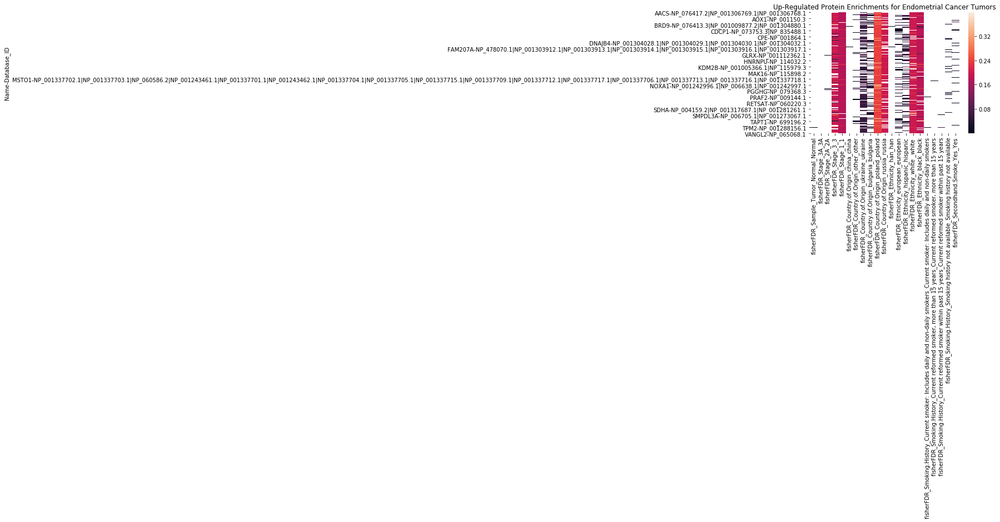

In [16]:
#Simple visualization
ax1 = plt.axes()
sns.heatmap(results_up, ax = ax1)
ax1.set_title('Up-Regulated Protein Enrichments for Endometrial Cancer Tumors')
plt.show()

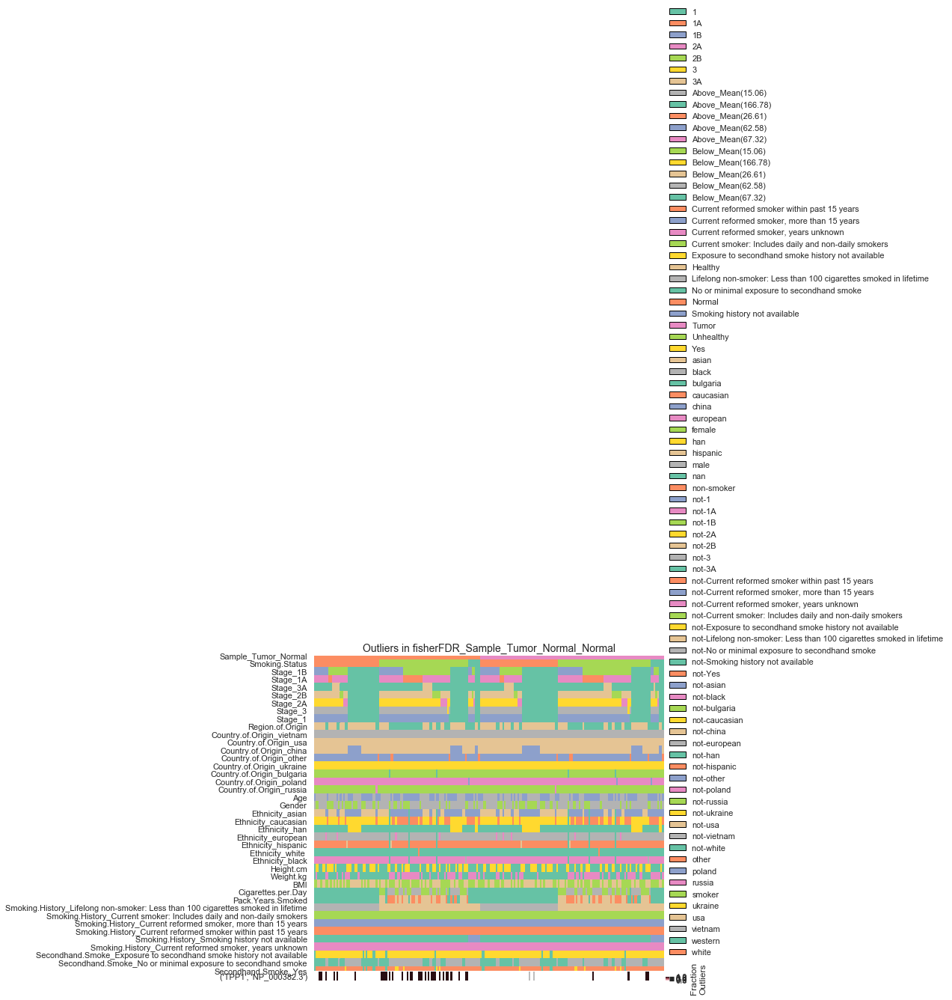

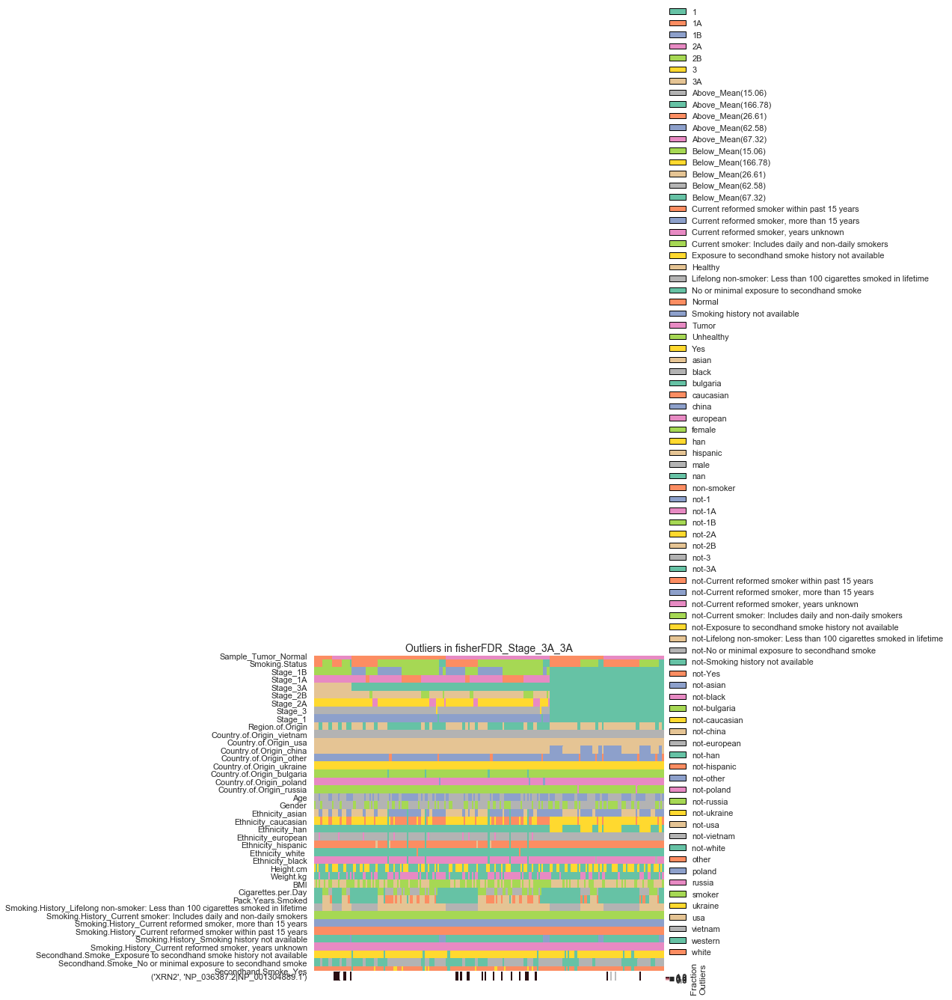

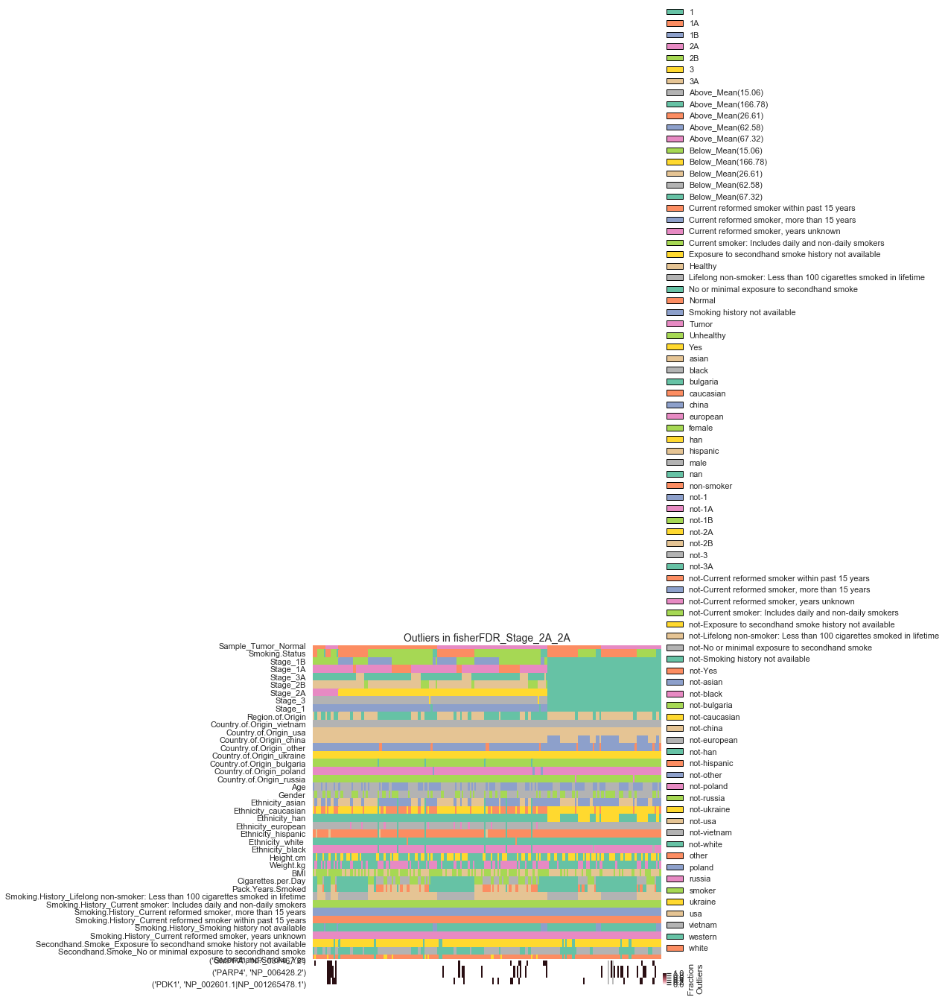

09/10/2019 18:06:47:WARNING:No significant genes at FDR 0.05 in fisherFDR_Stage_3_3
09/10/2019 18:06:47:WARNING:No significant genes at FDR 0.05 in fisherFDR_Stage_1_1


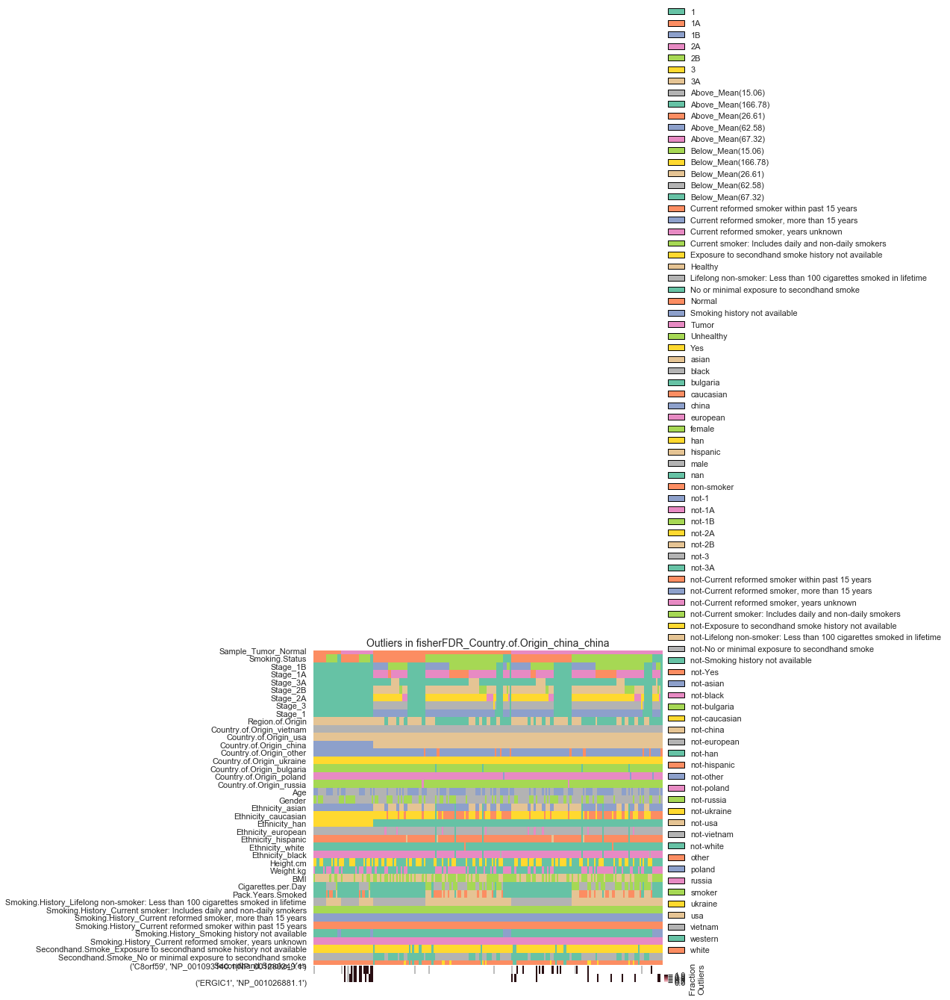

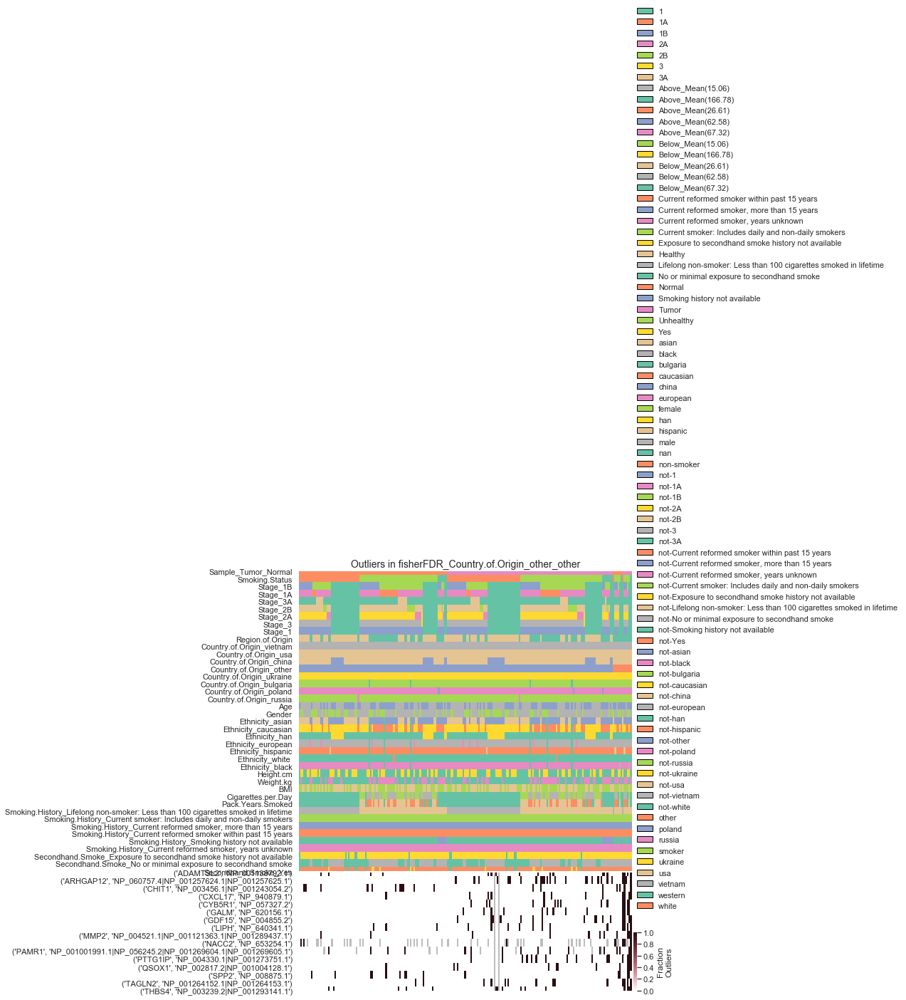

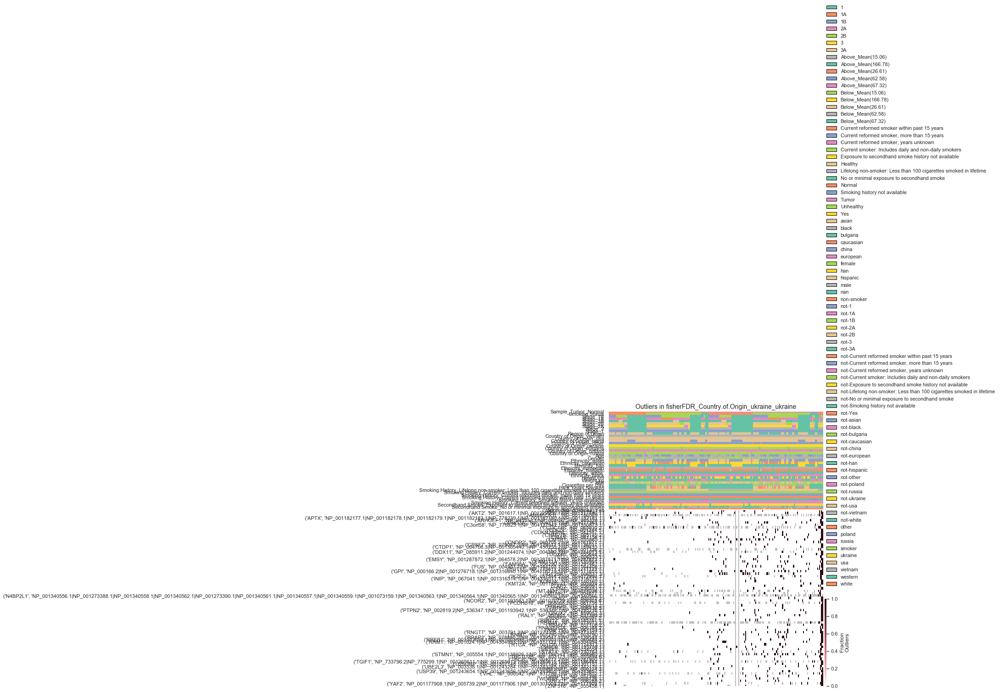

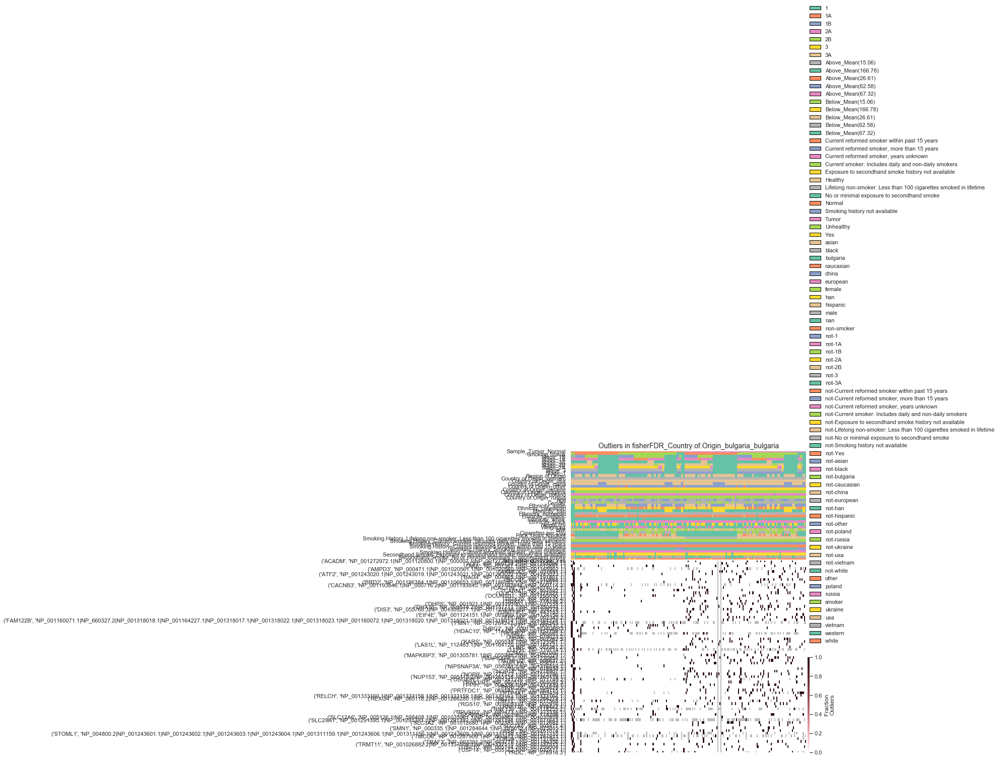

09/10/2019 18:07:29:WARNING:No significant genes at FDR 0.05 in fisherFDR_Country.of.Origin_poland_poland
09/10/2019 18:07:29:WARNING:No significant genes at FDR 0.05 in fisherFDR_Country.of.Origin_russia_russia


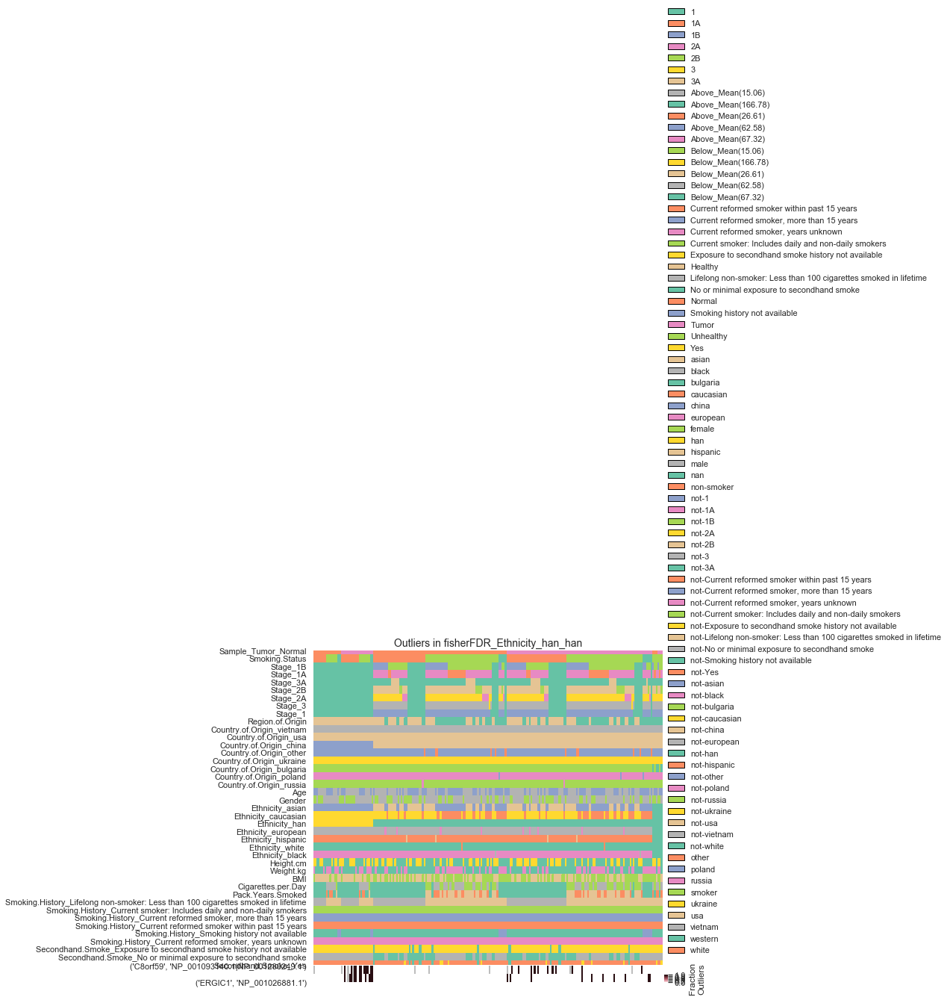

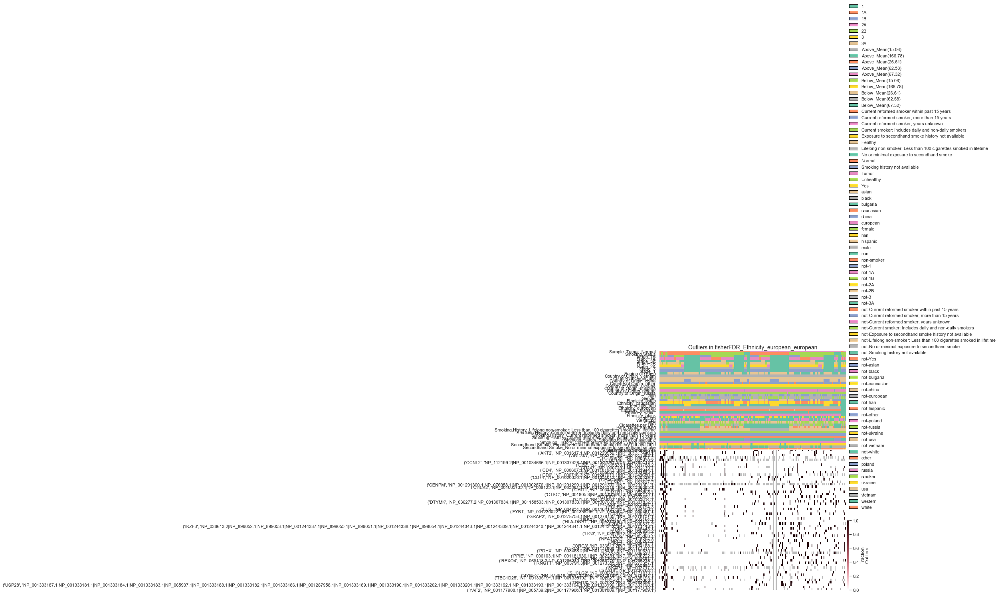

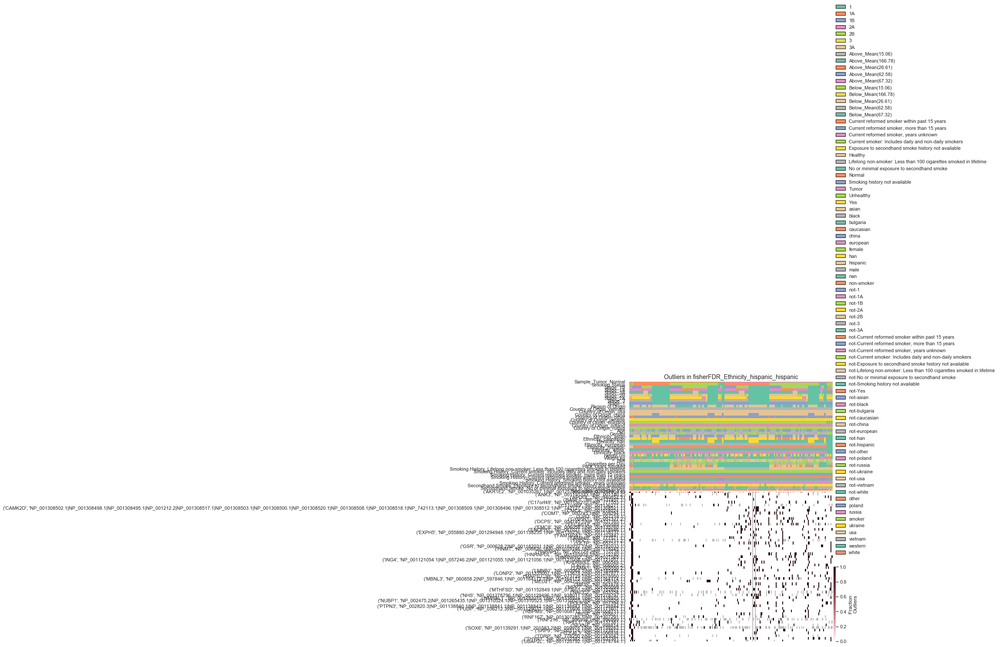

09/10/2019 18:07:56:WARNING:No significant genes at FDR 0.05 in fisherFDR_Ethnicity_white _white 
09/10/2019 18:07:56:WARNING:No significant genes at FDR 0.05 in fisherFDR_Ethnicity_black_black


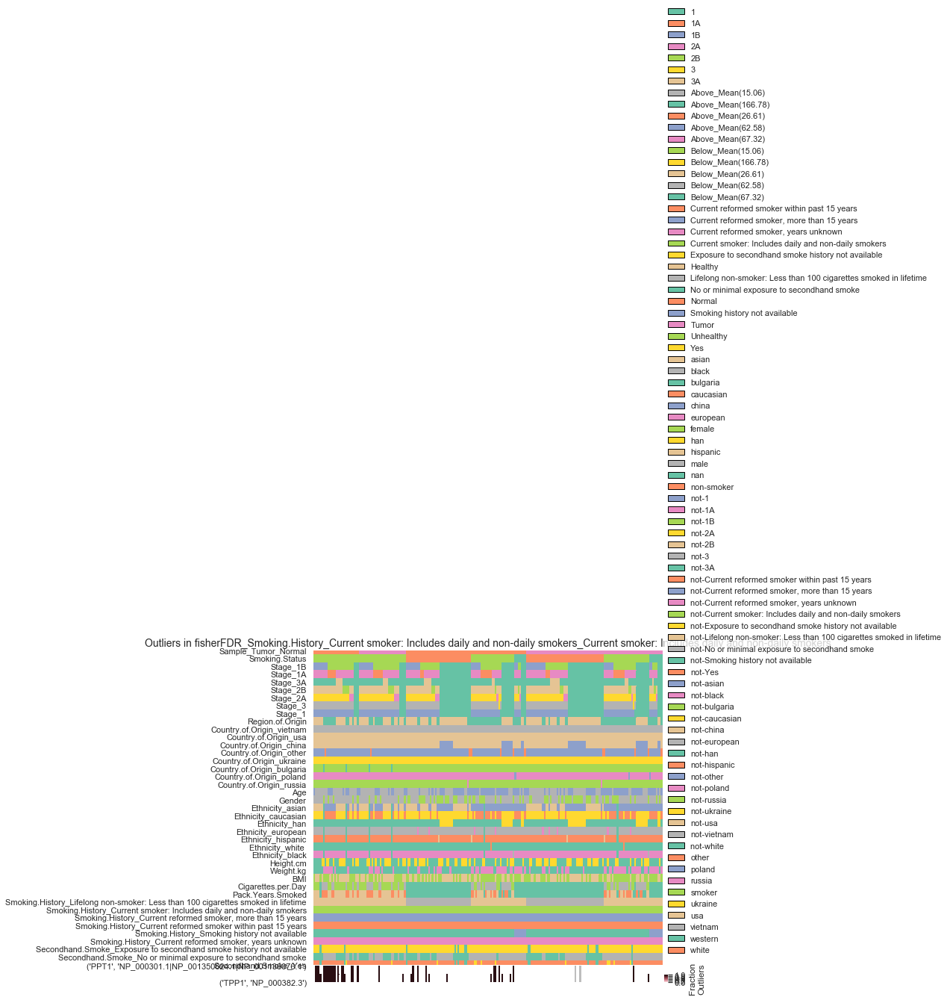

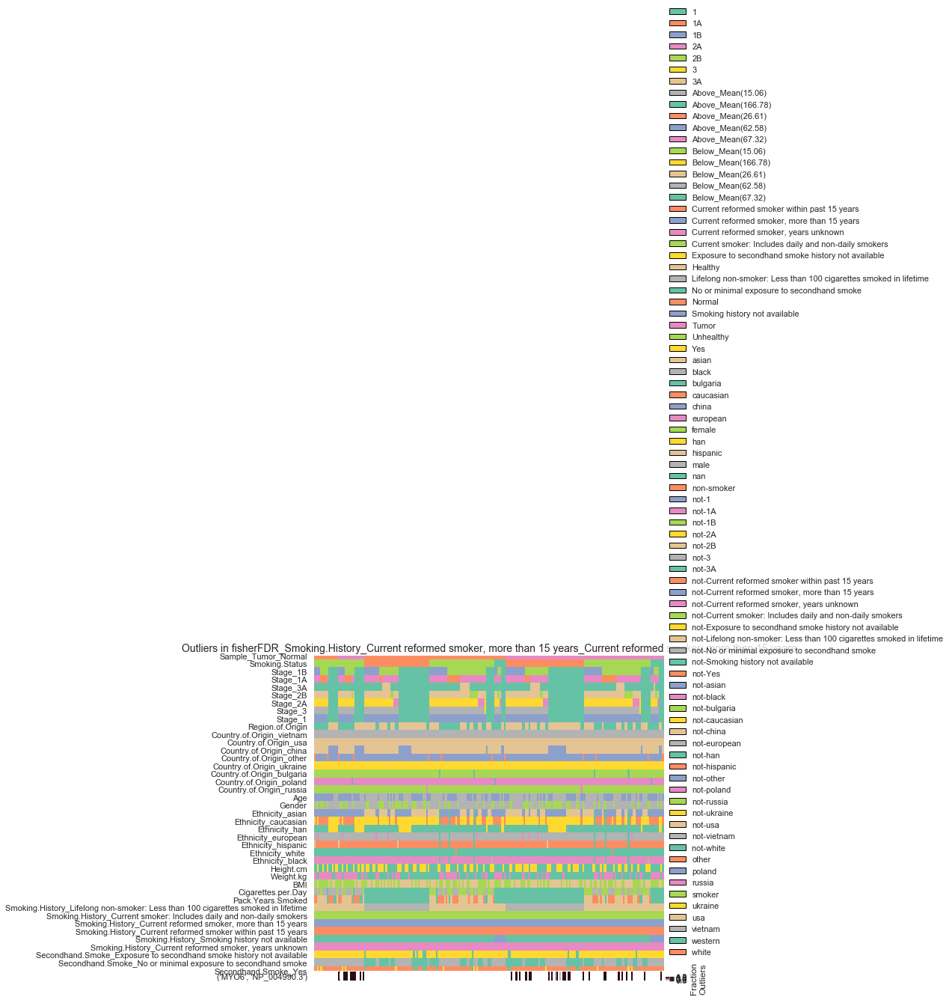

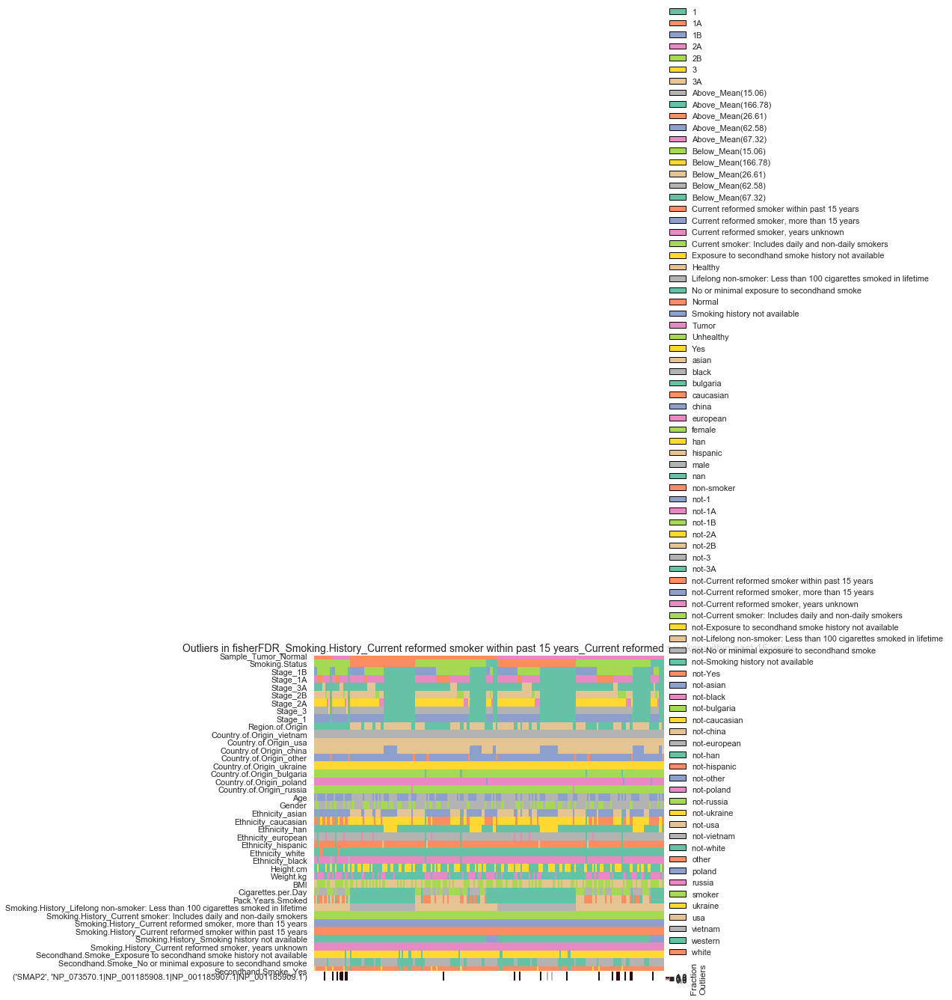

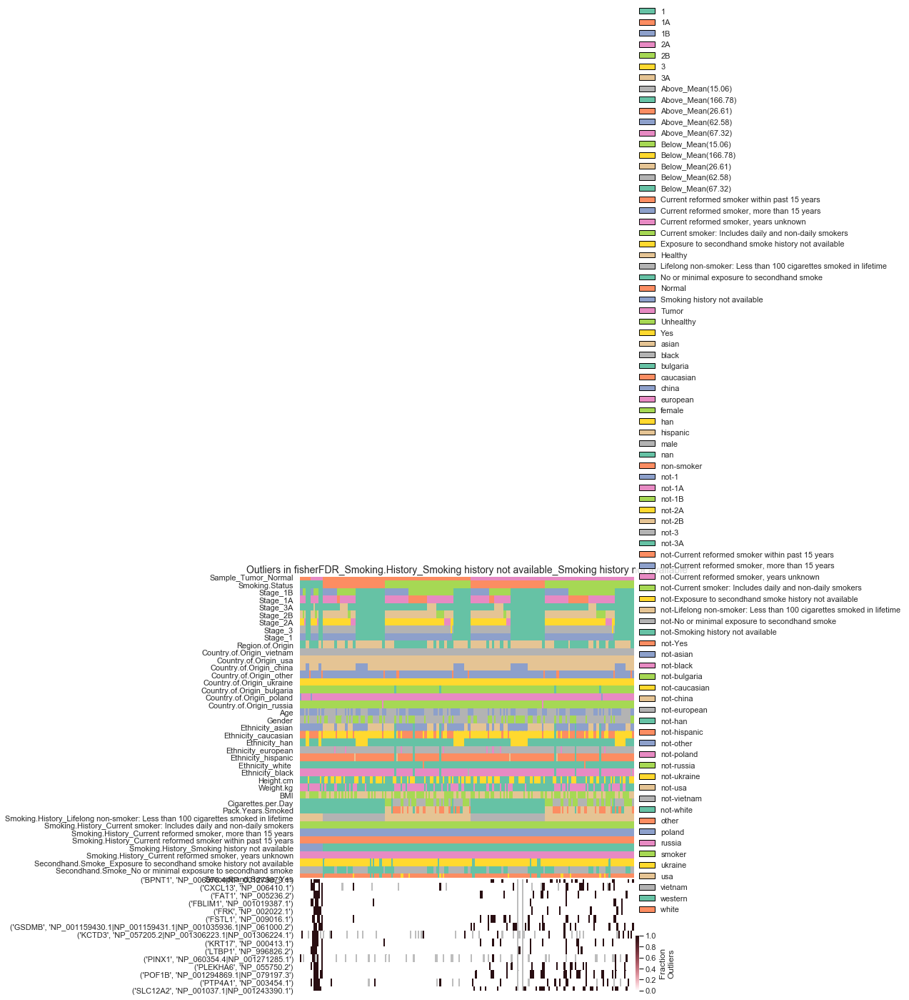

09/10/2019 18:08:35:WARNING:No significant genes at FDR 0.05 in fisherFDR_Smoking.History_Current reformed smoker, years unknown_Current reformed smoker, years unknown


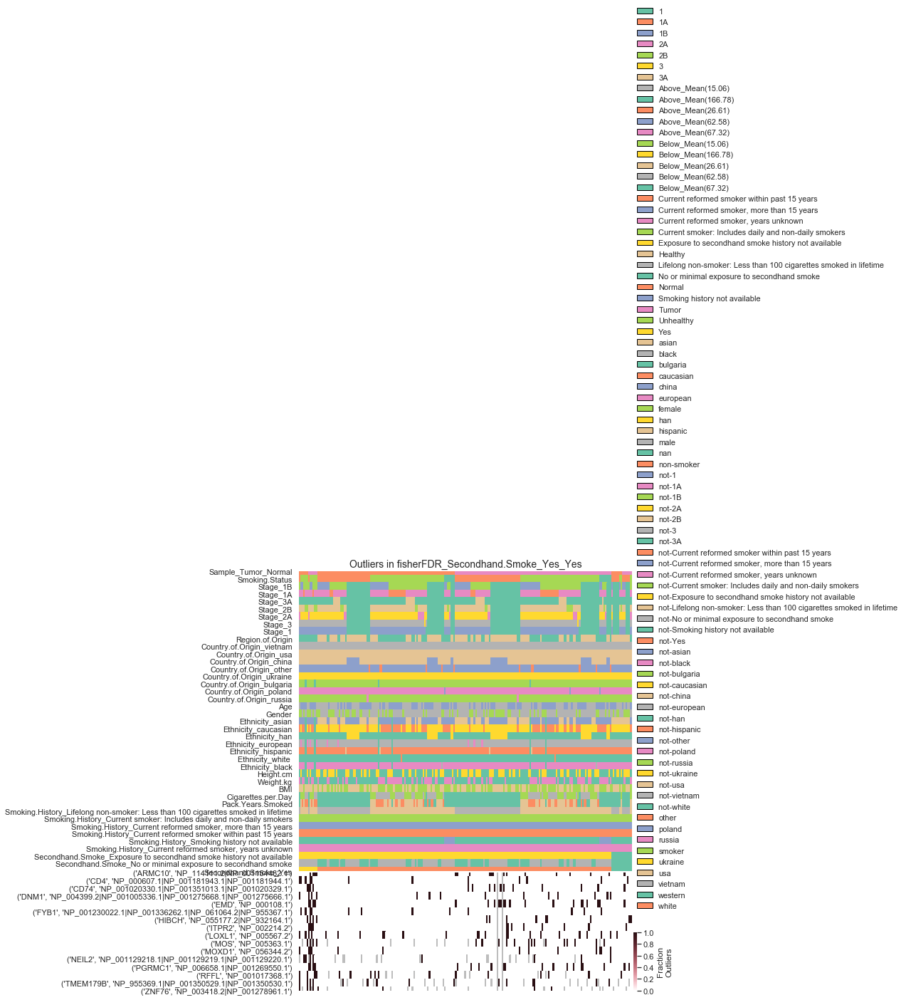

In [17]:
#Deva package visualization
for col in qvalues.df.columns:
    deva.plot_heatmap(
    annotations=annotations,
    qvals=qvalues.df,
    col_of_interest=col,
    vis_table=outliers.frac_table)
    
    plt.show()
    plt.close()

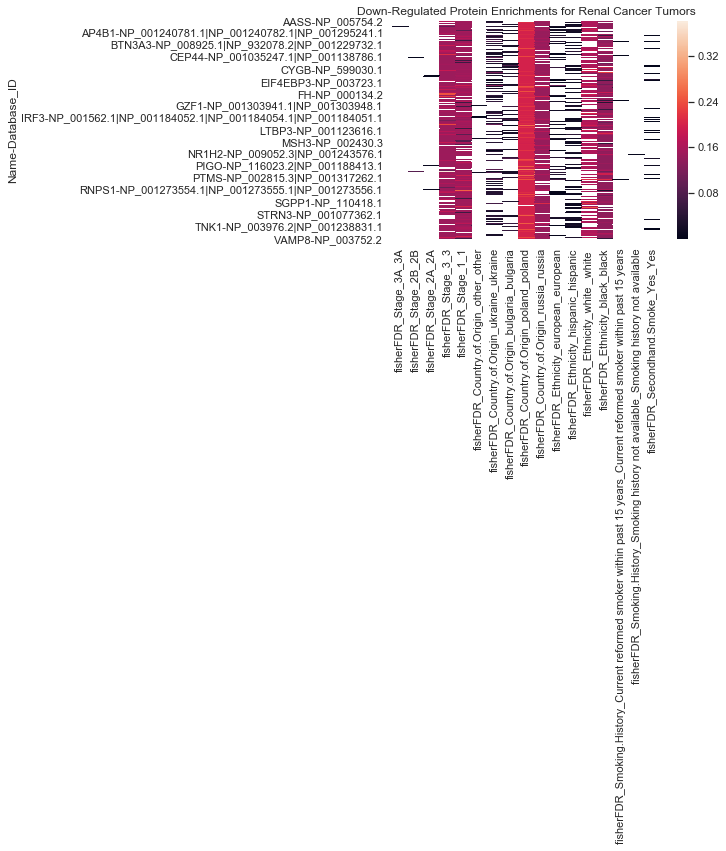

In [18]:
ax2 = plt.axes()
sns.heatmap(results_down, ax = ax2)
ax2.set_title('Down-Regulated Protein Enrichments for Renal Cancer Tumors')
plt.show()

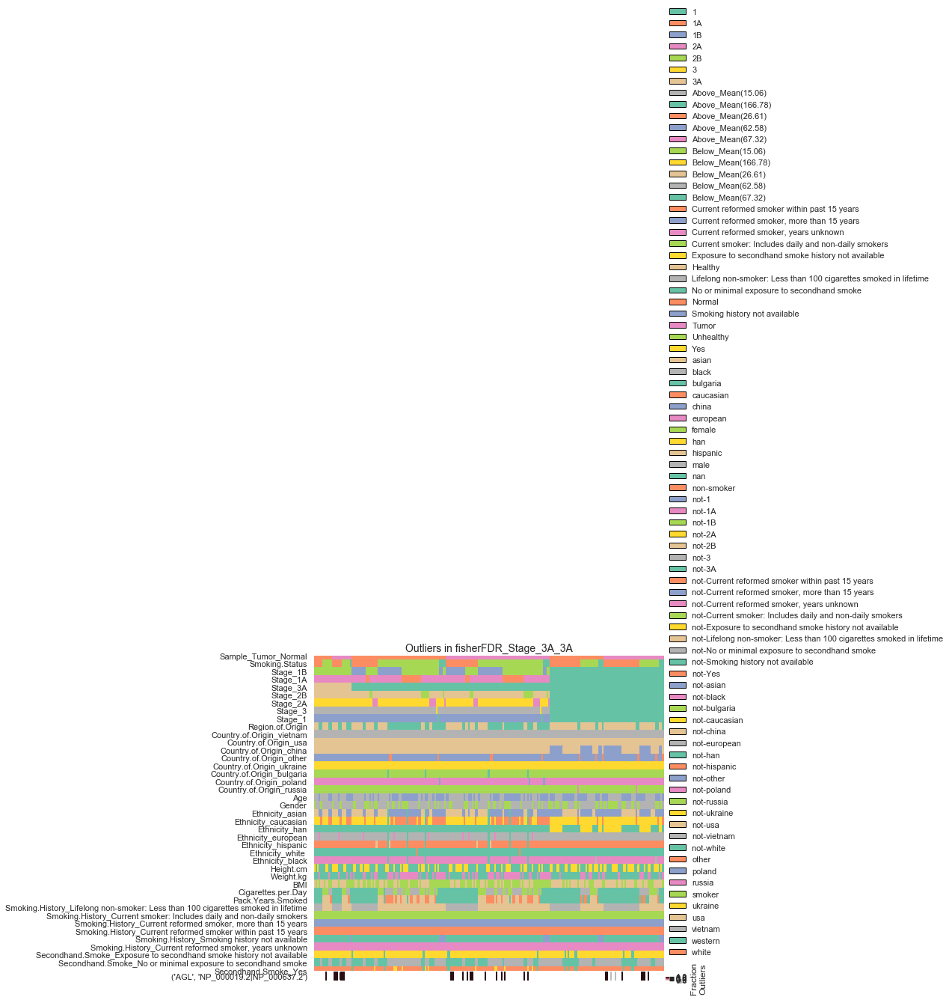

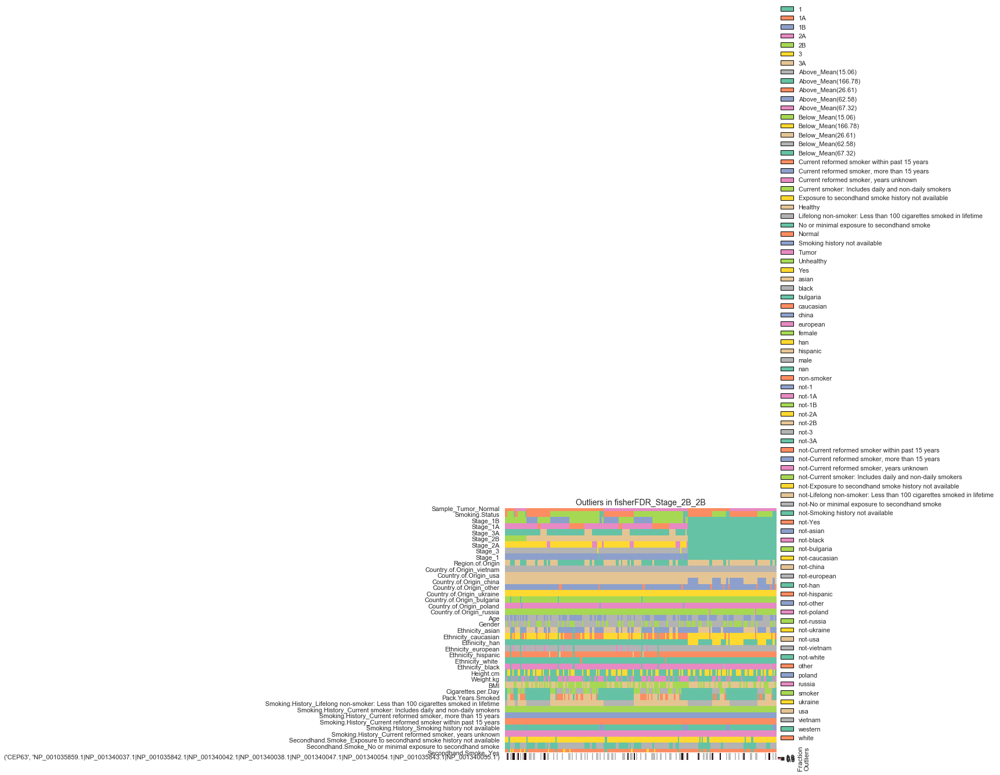

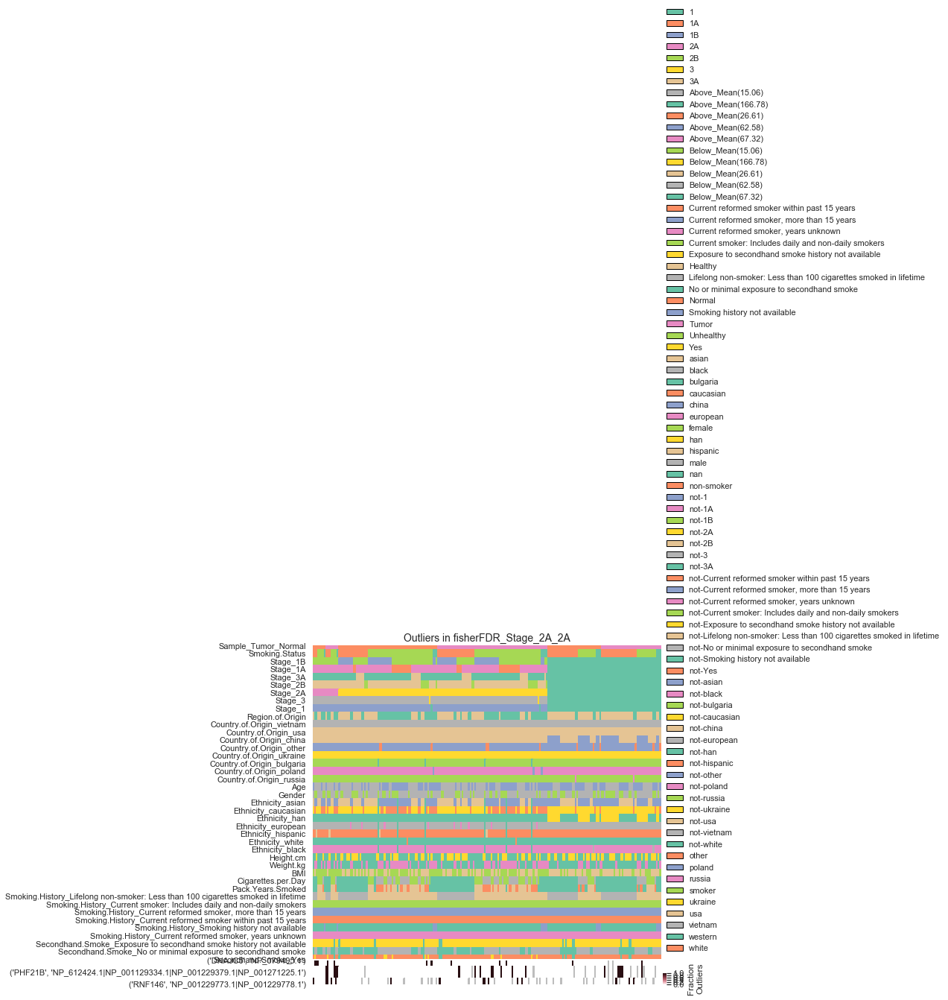

09/10/2019 18:09:01:WARNING:No significant genes at FDR 0.05 in fisherFDR_Stage_3_3
09/10/2019 18:09:01:WARNING:No significant genes at FDR 0.05 in fisherFDR_Stage_1_1


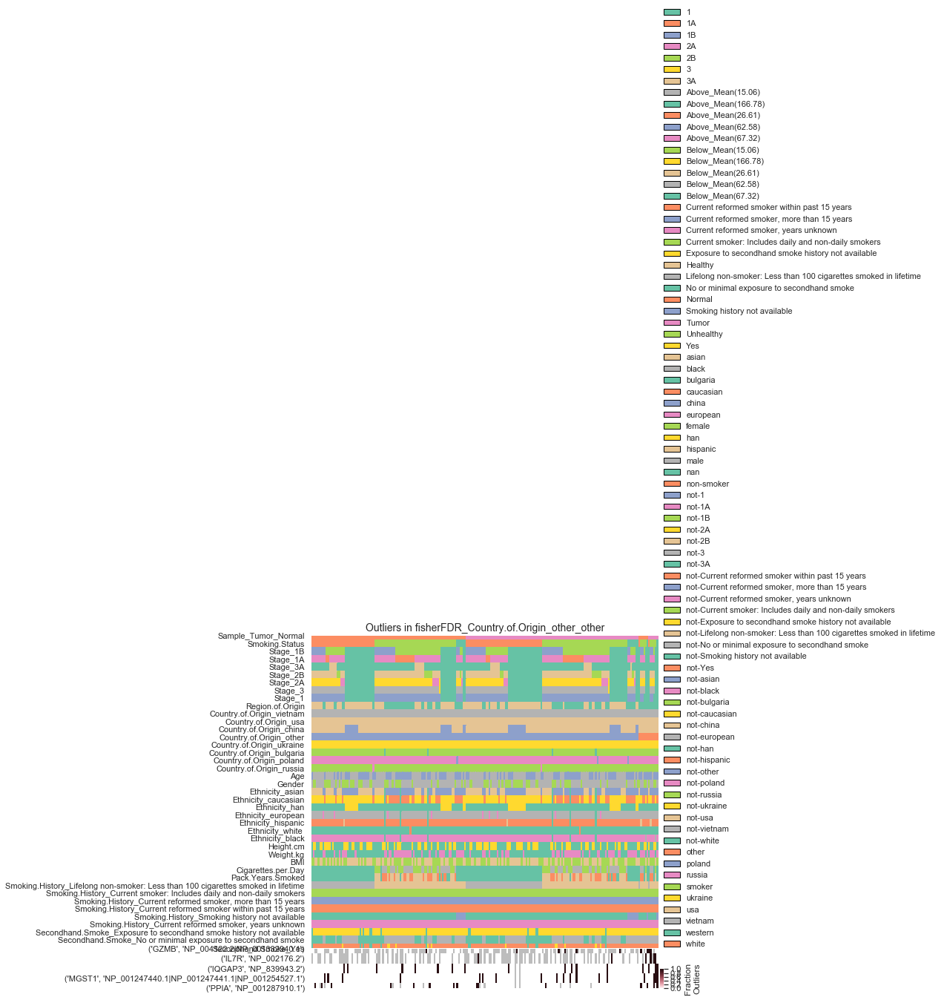

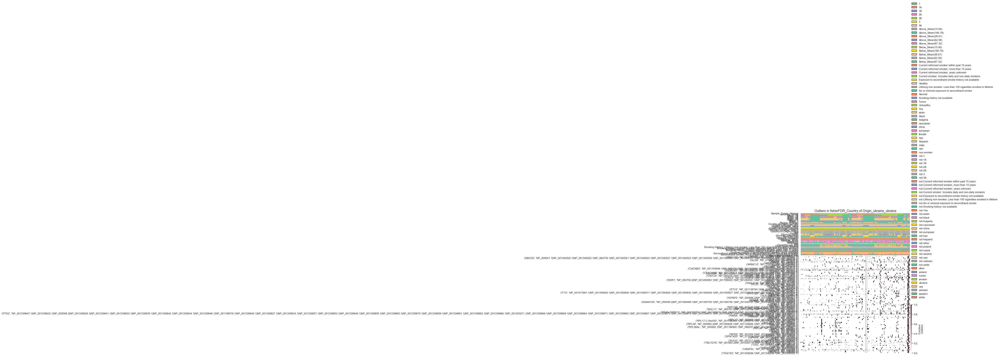

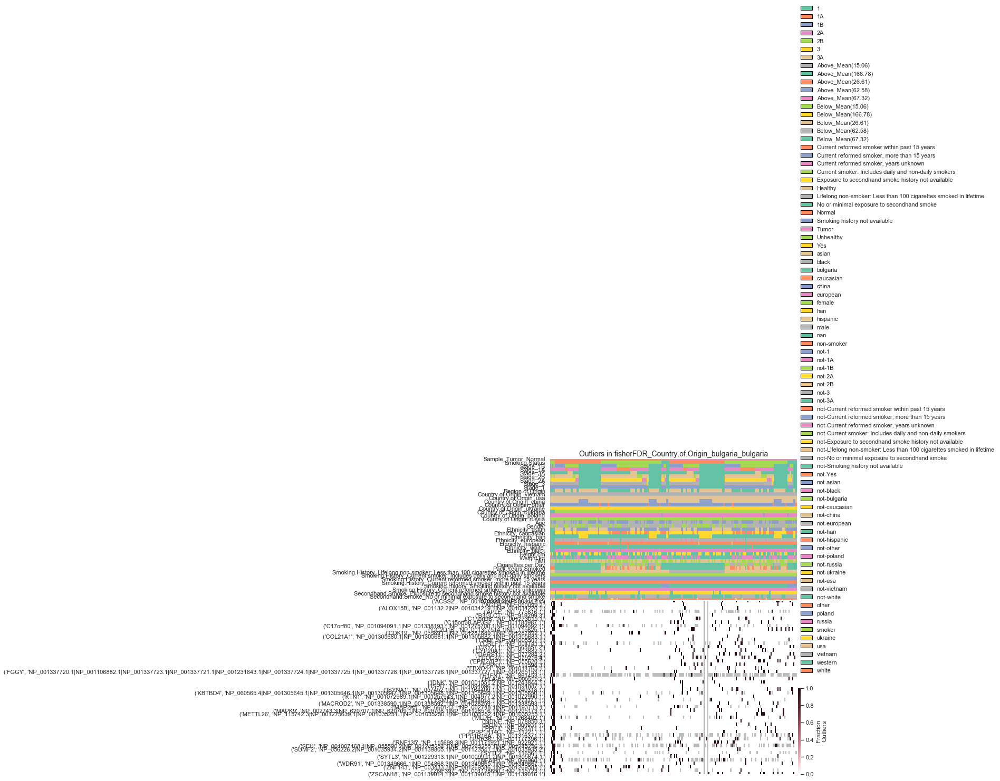

09/10/2019 18:09:31:WARNING:No significant genes at FDR 0.05 in fisherFDR_Country.of.Origin_poland_poland
09/10/2019 18:09:31:WARNING:No significant genes at FDR 0.05 in fisherFDR_Country.of.Origin_russia_russia


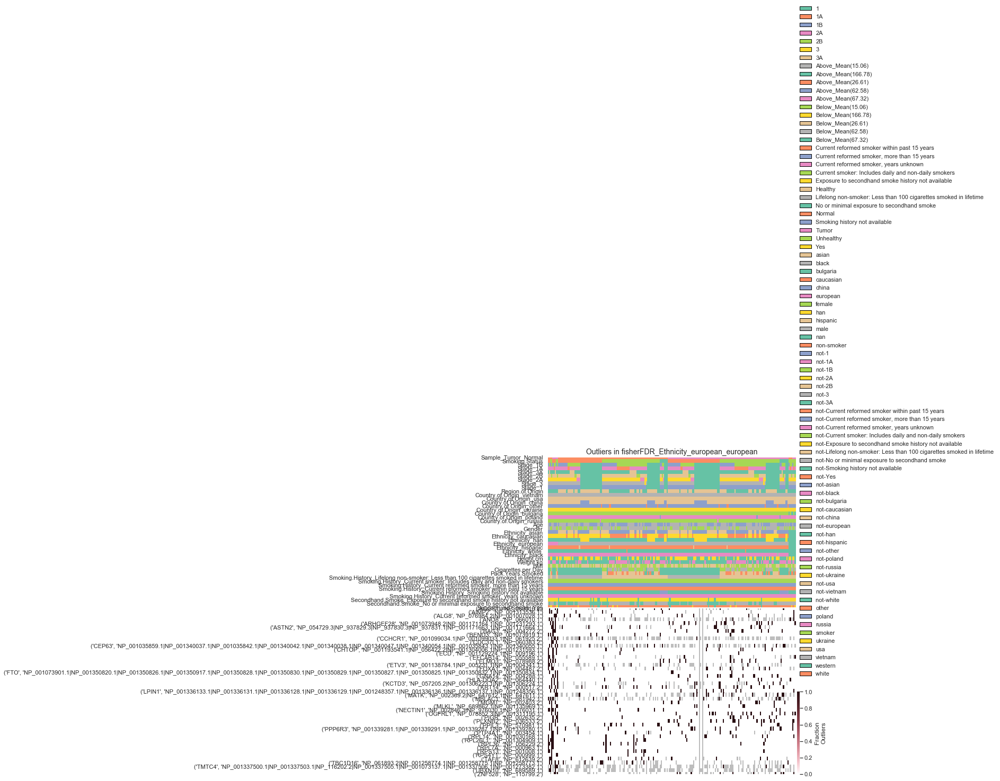

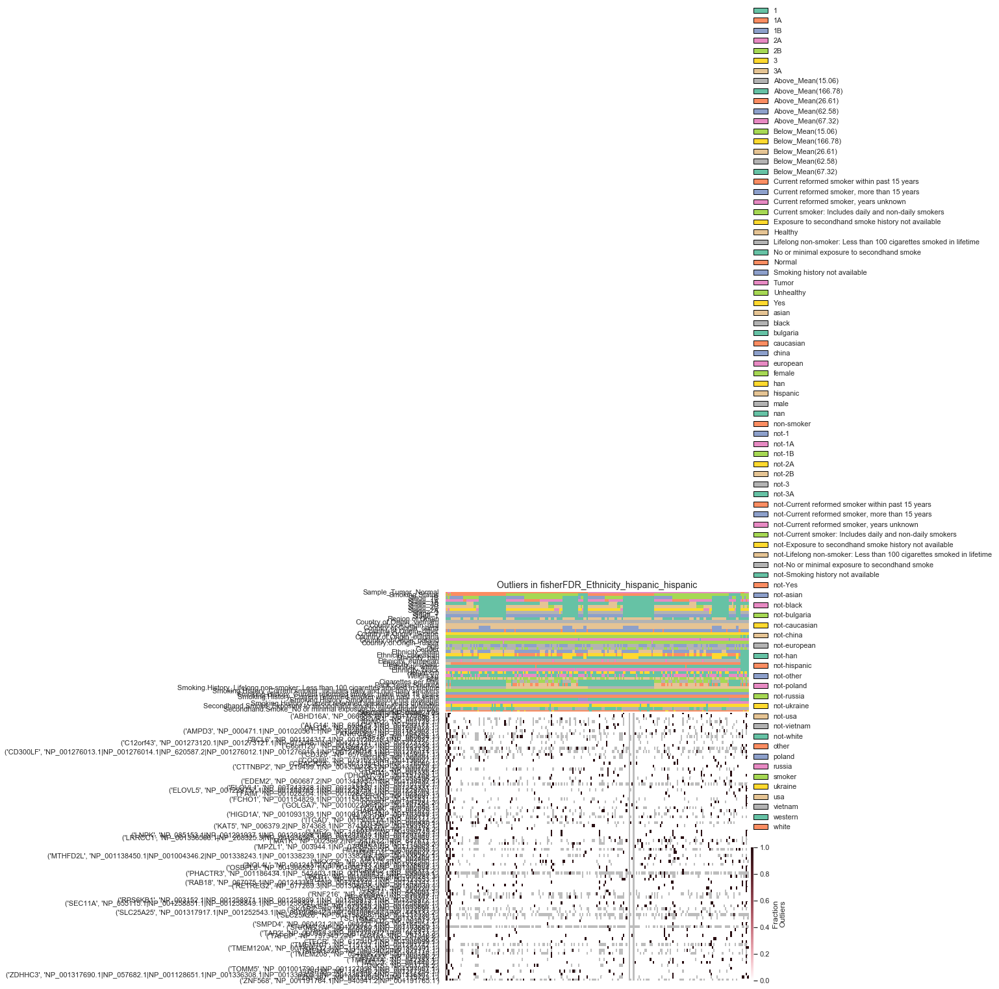

09/10/2019 18:09:50:WARNING:No significant genes at FDR 0.05 in fisherFDR_Ethnicity_white _white 


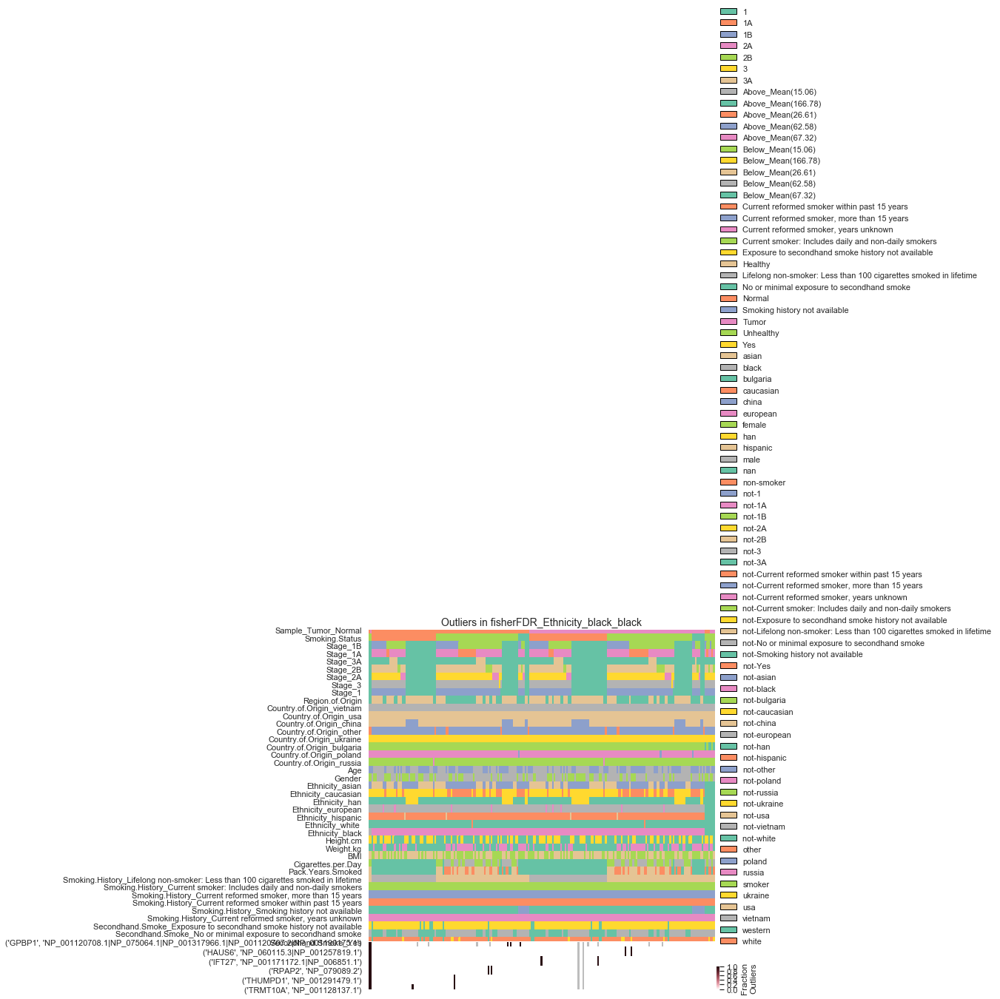

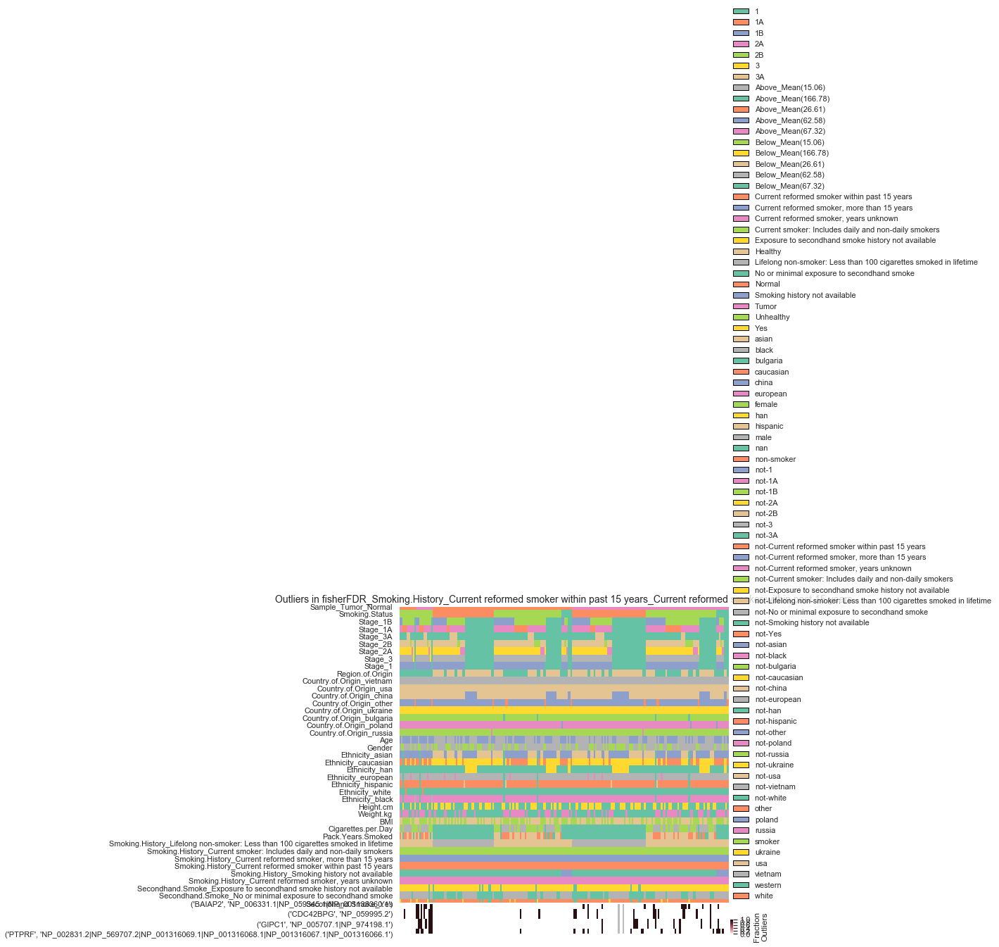

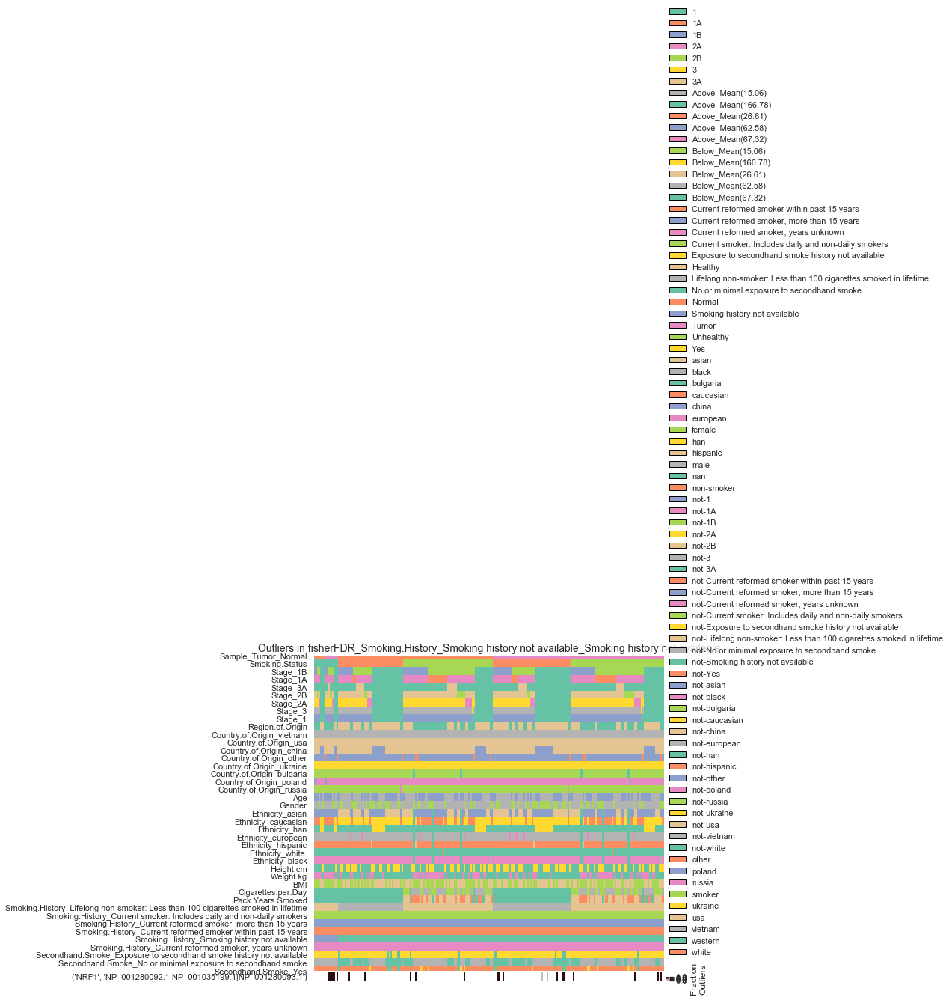

09/10/2019 18:10:06:WARNING:No significant genes at FDR 0.05 in fisherFDR_Smoking.History_Current reformed smoker, years unknown_Current reformed smoker, years unknown


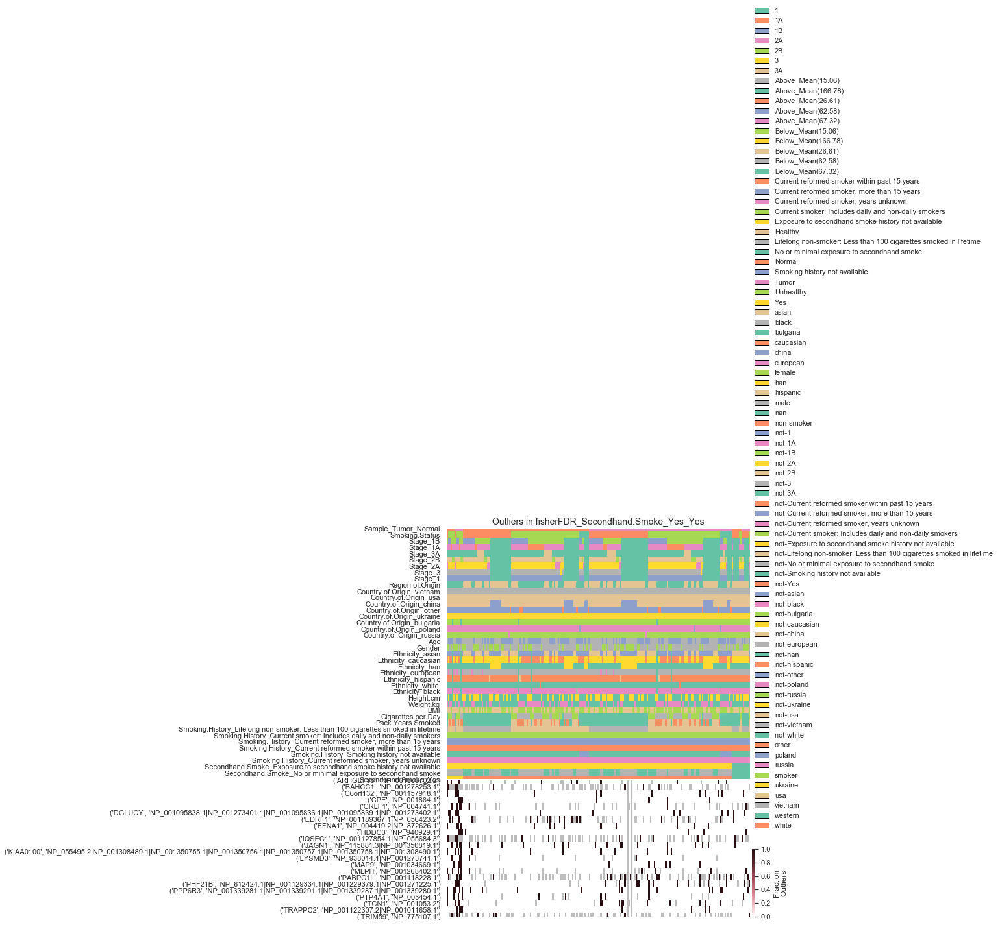

In [19]:
#Deva package visualization
for col in qvalues_down.df.columns:
    deva.plot_heatmap(
    annotations=annotations,
    qvals=qvalues_down.df,
    col_of_interest=col,
    vis_table=outliers_down.frac_table)
    
    plt.show()
    plt.close()

## Step 5: Perform Gene Set Enrichment Analysis

Part A: Up-regulated Genes

In [21]:
gsea_up = {}
for col in sig_cols_up:
    col_name = col.columns[0]
    col_name = "_".join(col_name.split(" "))
    print(col_name[:-9])
    gene_name_list = list(col.index)
    print('Gene List:', gene_name_list, '\n')
    enrichment = gp.enrichr(gene_list = gene_name_list, 
                            description=col_name, 
                            gene_sets='KEGG_2019_Human', 
                            outdir='test/LUAD')
    gsea_up[col_name] = enrichment
    barplot(enrichment.res2d, title=col_name, ofname=col_name)

Country.of.Origin_other_other
Gene List: [('ADAMTSL2', 'NP_001138792.1'), ('ARHGAP12', 'NP_060757.4|NP_001257624.1|NP_001257625.1'), ('CHIT1', 'NP_003456.1|NP_001243054.2'), ('CXCL17', 'NP_940879.1'), ('CYB5R1', 'NP_057327.2'), ('GALM', 'NP_620156.1'), ('GDF15', 'NP_004855.2'), ('LIPH', 'NP_640341.1'), ('MMP2', 'NP_004521.1|NP_001121363.1|NP_001289437.1'), ('NACC2', 'NP_653254.1'), ('PAMR1', 'NP_001001991.1|NP_056245.2|NP_001269604.1|NP_001269605.1'), ('PTTG1IP', 'NP_004330.1|NP_001273751.1'), ('QSOX1', 'NP_002817.2|NP_001004128.1'), ('SPP2', 'NP_008875.1'), ('TAGLN2', 'NP_001264152.1|NP_001264153.1'), ('THBS4', 'NP_003239.2|NP_001293141.1')] 



TypeError: sequence item 0: expected str instance, tuple found

Determine significant overlap for significantly up-regulated genes, first for patients with a history of cancer, and then for patients with invasive carcinoma.

In [20]:
gsea_sig_attributes = ['Histologic_Grade_FIGO_FIGO_grade_3_FIGO_grade_3', 
                       'Histologic_type_Serous', 
                       'Path_Stage_Primary_Tumor-pT_pT3a_(FIGO_IIIA)_pT3a_(FIGO_IIIA)', 
                       'Genomics_subtype_POLE_POLE']

gsea_sig_up_dict = {}

for attribute in gsea_sig_attributes:
    attribute += '_P_values'
    temp_df = gsea_up[attribute].res2d
    sig_filter = temp_df['Adjusted P-value'] < 0.05
    sig_terms = temp_df[sig_filter]
    gsea_sig_up_dict[attribute] = sig_terms
    print(attribute)
    print(gsea_sig_up_dict[attribute][['Term', 'Overlap', 'Adjusted P-value']])
    print('\n')

Histologic_Grade_FIGO_FIGO_grade_3_FIGO_grade_3_P_values
                                       Term Overlap  Adjusted P-value
0                               Ferroptosis    4/40          0.024885
1  Human immunodeficiency virus 1 infection   7/212          0.034914


Histologic_type_Serous_P_values
                                Term Overlap  Adjusted P-value
0  Ribosome biogenesis in eukaryotes  25/101      3.511333e-14
1                      RNA transport  26/165      3.813680e-10
2                        Spliceosome  23/134      7.691401e-10
3          mRNA surveillance pathway   15/91      4.555436e-06
4                     RNA polymerase    6/31      1.497268e-02
5           Hepatocellular carcinoma  14/168      2.268595e-02


Path_Stage_Primary_Tumor-pT_pT3a_(FIGO_IIIA)_pT3a_(FIGO_IIIA)_P_values
                             Term Overlap  Adjusted P-value
0                  Focal adhesion   6/199          0.001634
1        ECM-receptor interaction    4/82          0.005298
2    

In [21]:
for k, v in gsea_sig_up_dict.items():
    print(k)
    print(v[['Term', 'Overlap', 'Adjusted P-value']])
    print('\n')

Histologic_Grade_FIGO_FIGO_grade_3_FIGO_grade_3_P_values
                                       Term Overlap  Adjusted P-value
0                               Ferroptosis    4/40          0.024885
1  Human immunodeficiency virus 1 infection   7/212          0.034914


Histologic_type_Serous_P_values
                                Term Overlap  Adjusted P-value
0  Ribosome biogenesis in eukaryotes  25/101      3.511333e-14
1                      RNA transport  26/165      3.813680e-10
2                        Spliceosome  23/134      7.691401e-10
3          mRNA surveillance pathway   15/91      4.555436e-06
4                     RNA polymerase    6/31      1.497268e-02
5           Hepatocellular carcinoma  14/168      2.268595e-02


Path_Stage_Primary_Tumor-pT_pT3a_(FIGO_IIIA)_pT3a_(FIGO_IIIA)_P_values
                             Term Overlap  Adjusted P-value
0                  Focal adhesion   6/199          0.001634
1        ECM-receptor interaction    4/82          0.005298
2    

In [22]:
gsea_terms_and_genes = {}

for attribute, vals in gsea_sig_up_dict.items():
    genes = vals['Genes']
    terms = vals['Term']
    terms_and_genes = {}
    for i, gene in enumerate(genes):
        terms_and_genes[terms[i]] = gene.split(';')
    gsea_terms_and_genes[attribute] = terms_and_genes

In [23]:
figo3_dict = gsea_terms_and_genes['Histologic_Grade_FIGO_FIGO_grade_3_FIGO_grade_3_P_values']
figo3_dict

{'Ferroptosis': ['STEAP3', 'SLC11A2', 'TP53', 'ATG5'],
 'Human immunodeficiency virus 1 infection': ['BST2',
  'RPS6KB2',
  'HLA-C',
  'NFATC2',
  'CGAS',
  'RIPK1',
  'SAMHD1']}

In [24]:
serous_dict = gsea_terms_and_genes['Histologic_type_Serous_P_values']
serous_dict

{'Hepatocellular carcinoma': ['SMARCE1',
  'SMARCD1',
  'SMARCC1',
  'SMARCB1',
  'PHF10',
  'CDKN2A',
  'ACTL6A',
  'KEAP1',
  'WNT7A',
  'ARID1A',
  'SMARCA4',
  'BRD7',
  'TP53',
  'BCL2L1'],
 'RNA polymerase': ['POLR3A',
  'POLR3B',
  'POLR2B',
  'POLR3C',
  'POLR3E',
  'POLR3F'],
 'RNA transport': ['POP1',
  'GEMIN2',
  'EIF4A3',
  'NMD3',
  'CASC3',
  'FXR1',
  'PNN',
  'NXF1',
  'XPO1',
  'SUMO1',
  'SUMO3',
  'XPO5',
  'RAE1',
  'EIF4B',
  'UPF2',
  'UPF1',
  'ELAC2',
  'RPP40',
  'NUP153',
  'SENP2',
  'RANGAP1',
  'EIF5',
  'NUP50',
  'NXF2B',
  'TACC3',
  'GEMIN5'],
 'Ribosome biogenesis in eukaryotes': ['POP1',
  'WDR3',
  'HEATR1',
  'NAT10',
  'NMD3',
  'NOL6',
  'FBL',
  'NXF1',
  'XPO1',
  'RIOK1',
  'MDN1',
  'WDR36',
  'NOP58',
  'UTP6',
  'CSNK2A1',
  'UTP4',
  'RPP40',
  'WDR75',
  'IMP4',
  'UTP18',
  'TBL3',
  'LSG1',
  'CSNK2B',
  'NXF2B',
  'MPHOSPH10'],
 'Spliceosome': ['SF3B4',
  'TCERG1',
  'AQR',
  'RBM25',
  'SF3B2',
  'EIF4A3',
  'DDX23',
  'PRPF40A',
  'W

In [25]:
path_stage_pT3a = gsea_terms_and_genes['Path_Stage_Primary_Tumor-pT_pT3a_(FIGO_IIIA)_pT3a_(FIGO_IIIA)_P_values']
path_stage_pT3a

{'Amoebiasis': ['LAMB3', 'LAMA3', 'LAMC2', 'PIK3R2'],
 'ECM-receptor interaction': ['LAMB3', 'LAMA3', 'LAMC2', 'ITGB6'],
 'Focal adhesion': ['LAMB3', 'LAMA3', 'LAMC2', 'PIK3R2', 'ITGB6', 'MET'],
 'Human papillomavirus infection': ['PARD6B',
  'LAMB3',
  'LAMA3',
  'LAMC2',
  'PIK3R2',
  'ITGB6'],
 'PI3K-Akt signaling pathway': ['LAMB3',
  'LAMA3',
  'LAMC2',
  'PIK3R2',
  'ITGB6',
  'MET'],
 'Small cell lung cancer': ['LAMB3', 'LAMA3', 'LAMC2', 'PIK3R2']}

## Step 6: Connect Findings with Druggable Genome Interactive Database (DGIdb)

In [26]:
figo3_requests = {}
figo3_requests_parsed = {}
for term, gene_list in figo3_dict.items():
    figo3_requests[term] = bf.dgidb_get_request(gene_list)
    figo3_requests_parsed[term] = bf.dgidb_json_parse(figo3_requests[term], genes=True)

print(json.dumps(figo3_requests_parsed, indent=4))

{
    "Ferroptosis": {
        "SLC11A2": {
            "CHEMBL259327": [
                "inhibitor"
            ]
        },
        "TP53": {
            "ASPIRIN": [
                "acetylation"
            ],
            "BORTEZOMIB": [
                "inhibitor"
            ],
            "HALOPERIDOL": [],
            "AMG-900": [],
            "EPIRUBICIN": [],
            "DABRAFENIB": [],
            "BEVACIZUMAB": [],
            "INK-128": [],
            "PROXYPHYLLINE": [],
            "DIETHYLSTILBESTROL": [],
            "AZD-6738": [],
            "STREPTONIGRIN": [],
            "Lesogaberan": [],
            "GEDATOLISIB": [],
            "URSODIOL": [],
            "DECITABINE": [],
            "PRAMLINTIDE": [],
            "IRINOTECAN": [],
            "TRAMETINIB": [],
            "DAUNORUBICIN": [],
            "ERLOTINIB": [],
            "SELICICLIB": [],
            "THIOTEPA": [],
            "CYCLOPHOSPHAMIDE": [],
            "GEMCITABINE": [],
         

In [27]:
serous_requests = {}
serous_requests_parsed = {}
for term, gene_list in serous_dict.items():
    serous_requests[term] = bf.dgidb_get_request(gene_list, anti_neoplastic=True)
    serous_requests_parsed[term] = bf.dgidb_json_parse(serous_requests[term], genes=True)

print("Parsed Requests:\n")
print(json.dumps(serous_requests_parsed, indent=4))

Parsed Requests:

{
    "Ribosome biogenesis in eukaryotes": {
        "CSNK2A1": {
            "SILMITASERTIB": [
                "inhibitor"
            ],
            "RESVERATROL": []
        }
    },
    "RNA transport": null,
    "Spliceosome": null,
    "mRNA surveillance pathway": null,
    "RNA polymerase": null,
    "Hepatocellular carcinoma": {
        "SMARCB1": {
            "PALBOCICLIB": [],
            "PENTANAL": [],
            "PANOBINOSTAT": [],
            "ALVOCIDIB": [],
            "VORINOSTAT": [],
            "FENRETINIDE": []
        },
        "CDKN2A": {
            "GSK-461364": [],
            "CRIZOTINIB": [],
            "INK-128": [],
            "ALVOCIDIB": [],
            "PACLITAXEL": [],
            "ABEMACICLIB": [],
            "CHEMBL1231206": [],
            "GEMCITABINE": [],
            "TRAMETINIB": [],
            "PF-00477736": [],
            "LETROZOLE": [],
            "ILORASERTIB": [],
            "Ribociclib": [],
            "IMATI

In [28]:
pT3a_requests = {}
pT3a_requests_parsed = {}
for term, gene_list in path_stage_pT3a.items():
    pT3a_requests[term] = bf.dgidb_get_request(gene_list)
    pT3a_requests_parsed[term] = bf.dgidb_json_parse(pT3a_requests[term], genes=True)

print("Parsed Requests:\n")
print(json.dumps(pT3a_requests_parsed, indent=4))

Parsed Requests:

{
    "Focal adhesion": {
        "LAMB3": {
            "OCRIPLASMIN": []
        },
        "LAMA3": {
            "OCRIPLASMIN": []
        },
        "LAMC2": {
            "OCRIPLASMIN": []
        },
        "PIK3R2": {
            "RG-7666": [
                "inhibitor"
            ],
            "WX-037": [
                "inhibitor"
            ],
            "PF-04691502": [
                "inhibitor"
            ],
            "Puquitinib": [
                "inhibitor"
            ],
            "PA-799": [
                "inhibitor"
            ],
            "ISOPRENALINE": [
                "agonist"
            ],
            "COPANLISIB": [
                "inhibitor"
            ],
            "DS-7423": [
                "inhibitor"
            ],
            "GSK-1059615": [
                "inhibitor"
            ],
            "OMIPALISIB": [
                "inhibitor"
            ],
            "RECILISIB": [
                "inhibitor"
   

}


## Step 7: Personalized Medicine

In [29]:
# To perform a request specifically for inhibitors, you may opt to use a loop
# While this option is slower than the map, it is more specific, and may be worth
# waiting a few more seconds to reduce manual sifting through interaction types
inhibitors = {}
for attribute, genes in sig_genes_up.items():
    inhibitors[attribute] = bf.dgidb_get_request(genes, interaction_types=['inhibitor'])

In [30]:
print('UP-REGULATED INHIBITOR REQUEST:\n')
inhibitors_parsed = {}
for attribute, request in inhibitors.items():
    inhibitors_parsed[attribute] = bf.dgidb_json_parse(request, genes=True)
print(json.dumps(inhibitors_parsed, indent=4))

UP-REGULATED INHIBITOR REQUEST:

{
    "Proteomics_Tumor_Normal_Tumor_not-Tumor": {
        "MAP2K7": {
            "AZD-8330": [
                "inhibitor"
            ],
            "BINIMETINIB": [
                "inhibitor"
            ],
            "DABRAFENIB MESYLATE": [
                "inhibitor"
            ],
            "COBIMETINIB": [
                "allosteric modulator",
                "inhibitor"
            ],
            "PD-0325901": [
                "inhibitor"
            ],
            "TRAMETINIB": [
                "inhibitor"
            ],
            "Refametinib": [
                "inhibitor"
            ],
            "IODOACETAMIDE": [
                "inhibitor"
            ],
            "SELUMETINIB": [
                "inhibitor"
            ]
        }
    },
    "Histologic_Grade_FIGO_FIGO grade 3_FIGO grade 3": {
        "CYP2J2": {
            "TERFENADINE": [
                "inhibitor"
            ]
        },
        "EIF2AK2": {
       

}


In [31]:
random.seed(8)
patients_to_check_up = []
for i in range(3):
    index = random.randrange(0, len(only_outliers_up))
    while clinical.index[index] not in outliers_up_dict.keys() and index < len(outliers_up_dict.keys()):
        index += 1
    patients_to_check_up.append(clinical.index[index])

In [32]:
personalized_up = {}
for patient in patients_to_check_up:
    patients_up_dict = bf.dgidb_get_request(outliers_up_dict[patient], 
                                            interaction_types = ['inhibitor'])
    parsed = bf.dgidb_json_parse(patients_up_dict, genes=True)
    personalized_up[patient] = parsed
print(json.dumps(personalized_up, indent = 4))

{
    "S066": {
        "ADA": {
            "CLADRIBINE": [
                "inhibitor"
            ],
            "DIPYRIDAMOLE": [
                "inhibitor"
            ],
            "EHNA": [
                "inhibitor"
            ],
            "PENTOSTATIN": [
                "inhibitor"
            ],
            "FLUDARABINE": [
                "inhibitor"
            ]
        },
        "AKR1A1": {
            "FOMEPIZOLE": [
                "inhibitor"
            ]
        },
        "AKR1C1": {
            "SALICYLIC ACID": [
                "inhibitor"
            ],
            "ASPIRIN": [
                "inhibitor"
            ]
        },
        "ATP6V1A": {
            "TILUDRONIC ACID": [
                "inhibitor"
            ],
            "BAFILOMYCIN A1": [
                "inhibitor"
            ],
            "BAFILOMYCIN B1": [
                "inhibitor"
            ]
        },
        "ATP6V1B2": {
            "GALLIUM NITRATE": [
                "i

}
